# Unsupervised Song Structure Discovery

## Problem

Can we divide a song into repeated structural sections using only its audio?

A song often revisits similar harmony, instrumentation, rhythm, and timbre.
These repetitions create patterns such as:

- Intro → Verse → Chorus → Verse → Chorus → Outro
- A → B → A → B → C → B
- Theme → Variation → Theme

No section labels are provided to the model.

## Approach

1. Load and inspect an audio recording.
2. Separate harmonic and percussive components.
3. synchronize musical features to detected beats.
4. Construct a recurrence graph connecting similar moments.
5. Add local connections between neighboring beats.
6. Compute a graph-Laplacian spectral embedding.
7. Cluster the embedding at several structural resolutions.
8. Convert cluster transitions into section boundaries.
9. Evaluate stability and recurrence separation.
10. Listen to representative sections and interpret the result.

The discovered labels describe acoustic similarity. Label `A` does not
automatically mean verse, and label `B` does not automatically mean chorus.

In [2]:
from pathlib import Path

import librosa
import librosa.display
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import scipy.linalg
import scipy.ndimage
import scipy.sparse.csgraph
import seaborn as sns
import soundfile as sf

from IPython.display import Audio, display
from sklearn.cluster import KMeans
from sklearn.metrics import adjusted_rand_score, silhouette_score

sns.set_theme(style="whitegrid", context="notebook")

RANDOM_STATE = 42
HOP_LENGTH = 512

np.set_printoptions(precision=3, suppress=True)

## 1. Load the audio

The default recording makes the notebook reproducible.

To analyze another song later, set `AUDIO_PATH` to a local audio file.
Use audio that you are legally permitted to analyze.

In [3]:
# Set this to a local file path to analyze your own recording.
# Example: AUDIO_PATH = Path("data/my_song.wav")
AUDIO_PATH = None

if AUDIO_PATH is None:
    audio_path = Path(librosa.ex("fishin"))
    track_name = "Karissa Hobbs — Let's Go Fishin'"
else:
    audio_path = Path(AUDIO_PATH)

    if not audio_path.exists():
        raise FileNotFoundError(f"Audio file not found: {audio_path}")

    track_name = audio_path.stem

y, sr = librosa.load(audio_path, sr=22_050, mono=True)

duration_seconds = librosa.get_duration(y=y, sr=sr)
duration_minutes = duration_seconds / 60

print(f"Track:       {track_name}")
print(f"Sample rate: {sr:,} Hz")
print(f"Samples:     {len(y):,}")
print(f"Duration:    {duration_seconds:.1f} seconds ({duration_minutes:.2f} minutes)")

display(Audio(y, rate=sr))

c:\Users\ADMIN\AppData\Local\Programs\Python\Python311\Lib\site-packages\requests\__init__.py:113: RequestsDependencyWarning: urllib3 (2.4.0) or chardet (7.4.3)/charset_normalizer (3.4.2) doesn't match a supported version!
  warnings.warn(


Track:       Karissa Hobbs — Let's Go Fishin'
Sample rate: 22,050 Hz
Samples:     2,932,408
Duration:    133.0 seconds (2.22 minutes)


## 2. Inspect the waveform and energy

The waveform shows amplitude over time.

Root-mean-square energy gives a smoother view of intensity and may expose
quiet introductions, energetic sections, pauses, and endings. Energy alone
cannot identify repeated musical sections, but it provides useful context.

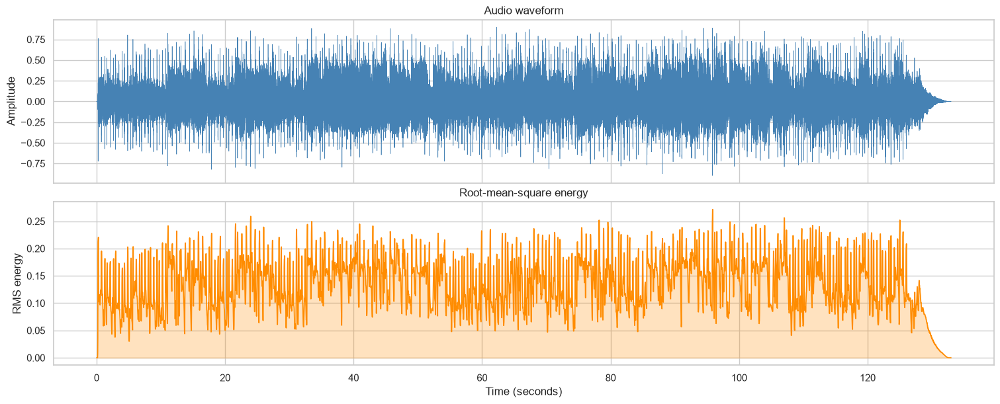

In [4]:
rms = librosa.feature.rms(y=y, hop_length=HOP_LENGTH)[0]

wave_times = np.arange(len(y)) / sr
rms_times = librosa.frames_to_time(
    np.arange(len(rms)),
    sr=sr,
    hop_length=HOP_LENGTH
)

fig, axes = plt.subplots(
    2,
    1,
    figsize=(15, 6),
    sharex=True,
    constrained_layout=True
)

axes[0].plot(wave_times, y, color="steelblue", linewidth=0.45)
axes[0].set(
    title="Audio waveform",
    ylabel="Amplitude"
)

axes[1].plot(rms_times, rms, color="darkorange", linewidth=1.2)
axes[1].fill_between(rms_times, rms, alpha=0.25, color="darkorange")
axes[1].set(
    title="Root-mean-square energy",
    xlabel="Time (seconds)",
    ylabel="RMS energy"
)

plt.show()

## Notes — Initial audio inspection

The recording is **133.0 seconds (2.22 minutes)** long and begins immediately with moderate energy rather than a sustained quiet introduction. The waveform and RMS curve remain active through most of the song, with rapid repeated fluctuations that reflect its regular musical pulse. Loudness changes are mostly gradual or local instead of forming a few clean, visually separable blocks.

The clearest global energy event is the ending: both amplitude and RMS fall rapidly during approximately the final five seconds, indicating a pronounced fade-out. Because the rest of the waveform remains comparatively dense and continuous, energy alone is insufficient for locating repeated verses or chorus-like passages. Harmonic and timbral information is required for the structural analysis.

## 3. Build beat-synchronized musical features

We describe each part of the recording with two feature families:

### Chroma

Chroma measures the prominence of the 12 musical pitch classes. It helps
recognize repeated harmonic progressions even when individual notes occur in
different octaves.

### MFCCs

Mel-frequency cepstral coefficients summarize short-term spectral shape.
They capture changes in timbre, instrumentation, and vocal texture.

Both representations are synchronized to beats. Consequently, the graph
compares musical positions rather than arbitrary fixed-length time windows.

In [5]:
# Separate harmonic and percussive content.
y_harmonic, y_percussive = librosa.effects.hpss(y)

# Harmonic representation.
chroma = librosa.feature.chroma_cqt(
    y=y_harmonic,
    sr=sr,
    hop_length=HOP_LENGTH
)

# Timbre representation.
mfcc = librosa.feature.mfcc(
    y=y,
    sr=sr,
    n_mfcc=20,
    hop_length=HOP_LENGTH
)

# Estimate beat positions from the percussive signal.
tempo, detected_beats = librosa.beat.beat_track(
    y=y_percussive,
    sr=sr,
    hop_length=HOP_LENGTH,
    trim=False
)

beat_frames = librosa.util.fix_frames(detected_beats, x_min=0)

if len(beat_frames) < 20:
    raise ValueError(
        "Too few beats were detected for reliable structural analysis."
    )

beat_times = librosa.frames_to_time(
    beat_frames,
    sr=sr,
    hop_length=HOP_LENGTH
)

# Aggregate the frame-level features within each beat interval.
chroma_sync = librosa.util.sync(
    chroma,
    beat_frames,
    aggregate=np.median
)

mfcc_sync = librosa.util.sync(
    mfcc,
    beat_frames,
    aggregate=np.mean
)

tempo_bpm = float(np.asarray(tempo).squeeze())

print(f"Estimated tempo:        {tempo_bpm:.1f} BPM")
print(f"Detected beat regions:  {chroma_sync.shape[1]}")
print(f"Chroma shape:           {chroma_sync.shape}")
print(f"MFCC shape:             {mfcc_sync.shape}")

Estimated tempo:        117.5 BPM
Detected beat regions:  254
Chroma shape:           (12, 254)
MFCC shape:             (20, 254)


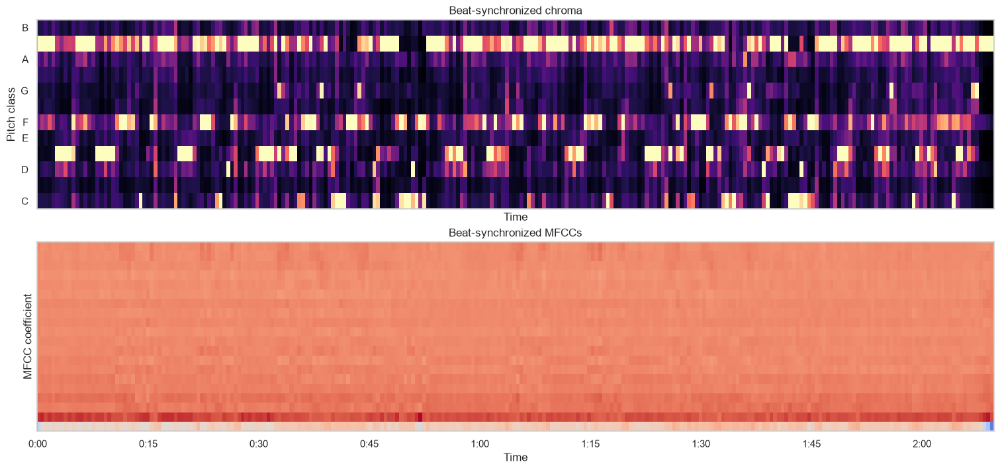

In [6]:
fig, axes = plt.subplots(
    2,
    1,
    figsize=(15, 7),
    sharex=True,
    constrained_layout=True
)

librosa.display.specshow(
    chroma_sync,
    x_coords=beat_times,
    x_axis="time",
    y_axis="chroma",
    cmap="magma",
    ax=axes[0]
)
axes[0].set_title("Beat-synchronized chroma")

librosa.display.specshow(
    mfcc_sync,
    x_coords=beat_times,
    x_axis="time",
    cmap="coolwarm",
    ax=axes[1]
)
axes[1].set(
    title="Beat-synchronized MFCCs",
    ylabel="MFCC coefficient"
)

plt.show()

## Notes — Musical representation

The estimated tempo is **117.5 BPM**, and the recording is represented by **254 beat-synchronized regions**. Each region has 12 chroma values describing pitch-class activity and 20 MFCC values describing timbre.

The chromagram contains repeated bands and short pitch-class patterns at widely separated times. This is useful evidence of recurring harmonic material. The MFCC representation is more uniform overall, which suggests that the recording retains a broadly consistent instrumental and vocal texture, but localized vertical changes still mark possible transitions. The ending also becomes distinct as the audio fades.

Beat synchronization makes each observation correspond to a musically meaningful interval. It also reduces sensitivity to tiny timing differences: two performances of the same progression can be compared beat by beat even when their exact frame positions differ.

## 4. Construct the song graph

Every beat-sized region becomes a graph node.

Two kinds of edges are created:

1. **Recurrence edges** connect non-adjacent regions with similar harmonic
   patterns. These edges help identify repeated passages.
2. **Path edges** connect neighboring regions with similar timbre. These
   edges encourage temporally continuous sections.

Combining them prevents the clustering from treating a song as an unordered
collection of similar moments.

In [8]:
# Include short harmonic context around each beat.
chroma_context = librosa.feature.stack_memory(
    chroma_sync,
    n_steps=3,
    delay=1
)

# Connect harmonically similar, non-adjacent beat regions.
recurrence_graph = librosa.segment.recurrence_matrix(
    chroma_context,
    width=3,
    mode="affinity",
    sym=True
)

# Enhance diagonal paths representing repeated musical passages.
diagonal_filter = librosa.segment.timelag_filter(
    scipy.ndimage.median_filter
)

recurrence_graph = diagonal_filter(
    recurrence_graph,
    size=(1, 7)
)

# Measure the timbral change between consecutive beat regions.
mfcc_change = np.sum(np.diff(mfcc_sync, axis=1) ** 2, axis=0)

positive_changes = mfcc_change[mfcc_change > 0]
change_scale = (
    np.median(positive_changes)
    if len(positive_changes)
    else 1.0
)

neighbor_similarity = np.exp(
    -mfcc_change / max(change_scale, np.finfo(float).eps)
)

# Place the similarities above and below the main diagonal.
path_graph = (
    np.diag(neighbor_similarity, k=1)
    + np.diag(neighbor_similarity, k=-1)
)

# Balance long-range recurrence and local continuity automatically.
path_degree = path_graph.sum(axis=1)
recurrence_degree = recurrence_graph.sum(axis=1)
total_degree = path_degree + recurrence_degree

mixing_weight = path_degree.dot(total_degree) / max(
    total_degree.dot(total_degree),
    np.finfo(float).eps
)

combined_graph = (
    mixing_weight * recurrence_graph
    + (1 - mixing_weight) * path_graph
)

print(f"Recurrence-graph weight: {mixing_weight:.3f}")
print(f"Path-graph weight:       {1 - mixing_weight:.3f}")
print(f"Graph shape:             {combined_graph.shape}")

Recurrence-graph weight: 0.145
Path-graph weight:       0.855
Graph shape:             (254, 254)


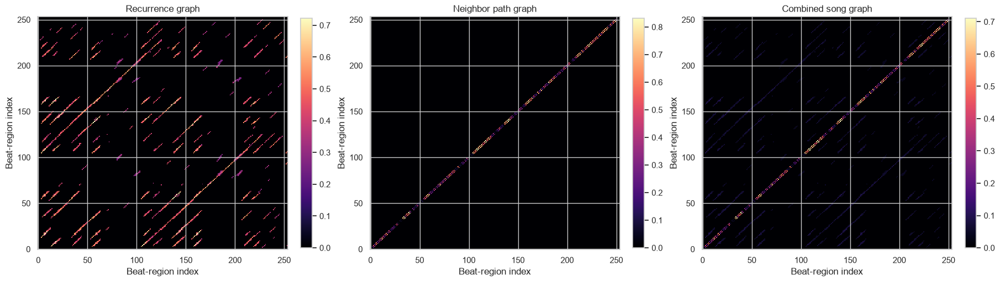

In [9]:
graph_names = [
    "Recurrence graph",
    "Neighbor path graph",
    "Combined song graph"
]

graphs = [
    recurrence_graph,
    path_graph,
    combined_graph
]

fig, axes = plt.subplots(
    1,
    3,
    figsize=(18, 5),
    constrained_layout=True
)

for ax, graph, name in zip(axes, graphs, graph_names):
    image = ax.imshow(
        graph,
        origin="lower",
        aspect="auto",
        interpolation="nearest",
        cmap="magma"
    )

    ax.set(
        title=name,
        xlabel="Beat-region index",
        ylabel="Beat-region index"
    )

    fig.colorbar(image, ax=ax, fraction=0.046, pad=0.04)

plt.show()

## Notes — Song graph

The recurrence graph contains many short, parallel off-diagonal streaks. A streak away from the main diagonal links two non-adjacent sequences of beats with similar chroma context, so these repeated patterns provide direct evidence that harmonic passages recur later in the song. The neighbor graph, by construction, is concentrated beside the main diagonal and preserves chronological continuity.

The automatic balance assigns **0.145** to long-range recurrence and **0.855** to the local path graph. Local continuity therefore dominates the combined graph, reducing the chance that isolated similar chords are grouped into scattered sections. The recurrence contribution is smaller but still preserves visible long-range diagonal families. Overall, the graph is sparse and structured rather than random: it represents a continuous song trajectory supplemented by repeated musical connections.

## 5. Compute the spectral embedding

The normalized graph Laplacian describes how the graph is connected.

Its lowest-frequency eigenvectors provide coordinates in which strongly
connected musical regions move closer together. Clustering these coordinates
is therefore different from clustering raw audio features directly.

In [11]:
normalized_laplacian = scipy.sparse.csgraph.laplacian(
    combined_graph,
    normed=True
)

eigenvalues, eigenvectors = scipy.linalg.eigh(
    normalized_laplacian
)

# Smooth each eigenvector through musical time.
smoothed_eigenvectors = scipy.ndimage.median_filter(
    eigenvectors,
    size=(9, 1)
)

# Cumulative normalization supports several segmentation resolutions.
cumulative_norm = np.sqrt(
    np.cumsum(smoothed_eigenvectors**2, axis=1)
)

cumulative_norm[cumulative_norm < 1e-10] = 1.0

spectral_embedding = (
    smoothed_eigenvectors / cumulative_norm
)

print("First 10 Laplacian eigenvalues:")
display(
    pd.DataFrame({
        "component": np.arange(1, 11),
        "eigenvalue": eigenvalues[:10]
    }).round(5)
)

First 10 Laplacian eigenvalues:


,component,eigenvalue
0,1,0.00000
1,2,0.01683
2,3,0.04204
3,4,0.05781
4,5,0.08218
5,6,0.08711
6,7,0.10075
7,8,0.11825
8,9,0.12610
9,10,0.13419


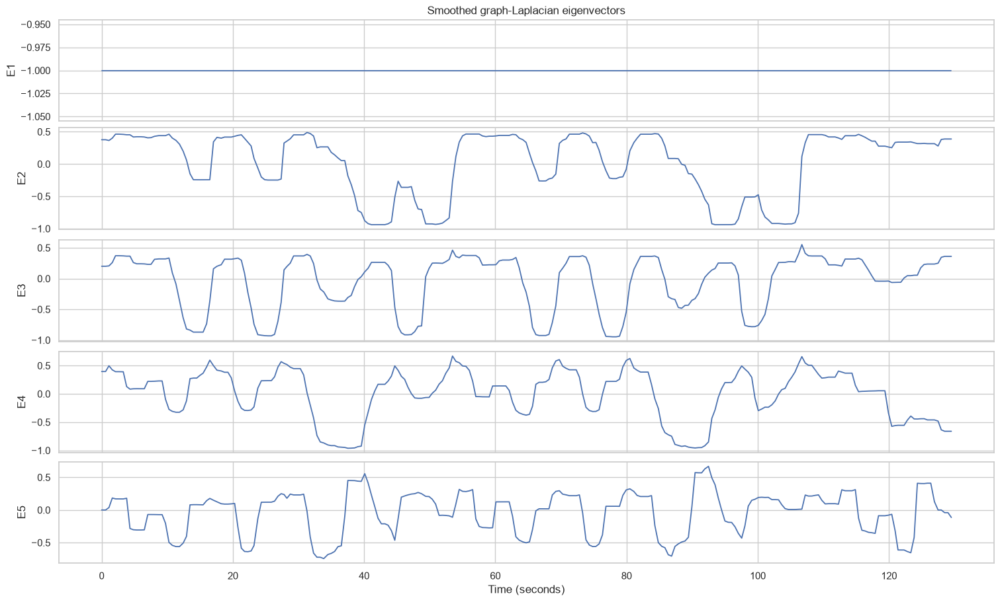

In [12]:
n_components_to_plot = min(5, spectral_embedding.shape[1])

fig, axes = plt.subplots(
    n_components_to_plot,
    1,
    figsize=(15, 9),
    sharex=True,
    constrained_layout=True
)

for component, ax in enumerate(np.atleast_1d(axes)):
    ax.plot(
        beat_times,
        spectral_embedding[:, component],
        linewidth=1.3
    )
    ax.set_ylabel(f"E{component + 1}")

axes[0].set_title("Smoothed graph-Laplacian eigenvectors")
axes[-1].set_xlabel("Time (seconds)")

plt.show()

## 6. Explore multiple structural resolutions

A song does not necessarily have one objectively correct segmentation.

At a coarse resolution, the model might separate only two broad musical
states. At a finer resolution, it may distinguish introductions, verses,
choruses, instrumental breaks, and transitions.

We examine several cluster counts instead of hiding this modeling decision.

In [13]:
def spectral_features(embedding, n_clusters):
    """Return row-normalized spectral coordinates for one resolution."""
    features = embedding[:, :n_clusters].copy()

    row_norms = np.linalg.norm(
        features,
        axis=1,
        keepdims=True
    )

    return features / np.maximum(row_norms, 1e-10)


def find_segment_runs(labels):
    """Return the start, end, and label of each consecutive label run."""
    starts = np.r_[
        0,
        1 + np.flatnonzero(labels[1:] != labels[:-1])
    ]

    ends = np.r_[starts[1:], len(labels)]

    return starts, ends, labels[starts]


def fit_resolution(n_clusters, random_state=RANDOM_STATE):
    features = spectral_features(
        spectral_embedding,
        n_clusters
    )

    model = KMeans(
        n_clusters=n_clusters,
        n_init=50,
        random_state=random_state
    )

    labels = model.fit_predict(features)

    return features, labels


max_clusters = min(8, len(beat_times) - 1)
candidate_clusters = range(2, max_clusters + 1)

labels_by_resolution = {}
score_rows = []

stability_seeds = [0, 7, 21, 84, 99]

for n_clusters in candidate_clusters:
    features, reference_labels = fit_resolution(n_clusters)

    starts, ends, _ = find_segment_runs(reference_labels)

    stability_scores = []

    for seed in stability_seeds:
        _, seed_labels = fit_resolution(
            n_clusters,
            random_state=seed
        )

        stability_scores.append(
            adjusted_rand_score(
                reference_labels,
                seed_labels
            )
        )

    silhouette = silhouette_score(
        features,
        reference_labels
    )

    fragmentation = len(starts) / len(reference_labels)
    mean_stability = np.mean(stability_scores)

    # Transparent heuristic: reward separation and stability while
    # mildly penalizing highly fragmented solutions.
    selection_score = (
        0.55 * silhouette
        + 0.35 * mean_stability
        - 0.10 * fragmentation
    )

    labels_by_resolution[n_clusters] = reference_labels

    score_rows.append({
        "clusters": n_clusters,
        "silhouette": silhouette,
        "mean_stability_ARI": mean_stability,
        "consecutive_segments": len(starts),
        "median_segment_beats": np.median(ends - starts),
        "fragmentation": fragmentation,
        "selection_score": selection_score
    })

score_table = pd.DataFrame(score_rows)

display(
    score_table.round(3).sort_values(
        "selection_score",
        ascending=False
    )
)

,clusters,silhouette,mean_stability_ARI,consecutive_segments,median_segment_beats,fragmentation,selection_score
0,2,0.760,1.000,13,17.0,0.051,0.763
1,3,0.724,1.000,19,10.0,0.075,0.741
2,4,0.590,1.000,24,9.0,0.094,0.665
3,5,0.540,1.000,30,8.0,0.118,0.635
4,6,0.436,1.000,41,7.0,0.161,0.574
5,7,0.357,0.990,46,5.0,0.181,0.525
6,8,0.354,0.855,43,5.0,0.169,0.477


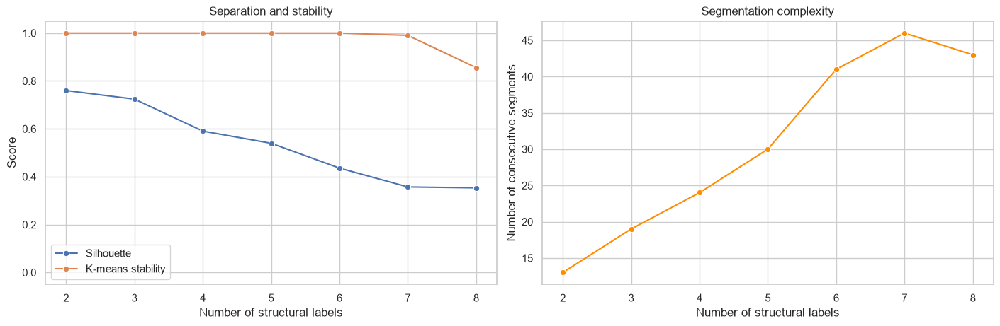

In [14]:
fig, axes = plt.subplots(
    1,
    2,
    figsize=(14, 4.5),
    constrained_layout=True
)

sns.lineplot(
    data=score_table,
    x="clusters",
    y="silhouette",
    marker="o",
    ax=axes[0],
    label="Silhouette"
)

sns.lineplot(
    data=score_table,
    x="clusters",
    y="mean_stability_ARI",
    marker="o",
    ax=axes[0],
    label="K-means stability"
)

axes[0].set(
    title="Separation and stability",
    xlabel="Number of structural labels",
    ylabel="Score",
    ylim=(-0.05, 1.05)
)

sns.lineplot(
    data=score_table,
    x="clusters",
    y="consecutive_segments",
    marker="o",
    color="darkorange",
    ax=axes[1]
)

axes[1].set(
    title="Segmentation complexity",
    xlabel="Number of structural labels",
    ylabel="Number of consecutive segments"
)

plt.show()

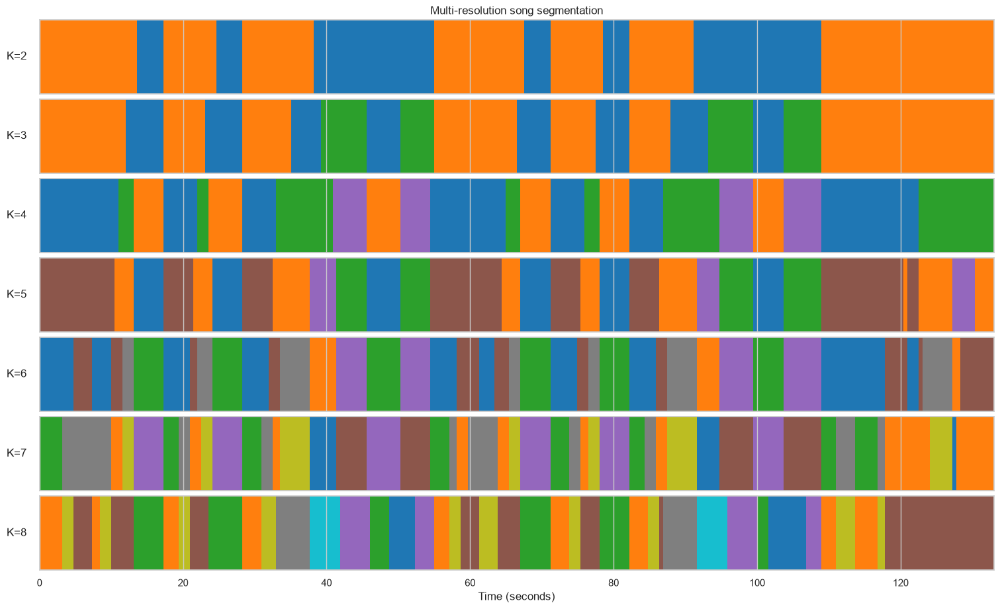

In [15]:
fig, axes = plt.subplots(
    len(labels_by_resolution),
    1,
    figsize=(15, 1.3 * len(labels_by_resolution)),
    sharex=True,
    constrained_layout=True
)

for ax, (n_clusters, labels) in zip(
    np.atleast_1d(axes),
    labels_by_resolution.items()
):
    ax.imshow(
        labels[np.newaxis, :],
        aspect="auto",
        interpolation="nearest",
        extent=[beat_times[0], duration_seconds, 0, 1],
        cmap="tab10",
        vmin=0,
        vmax=max_clusters - 1
    )

    ax.set_yticks([])
    ax.set_ylabel(
        f"K={n_clusters}",
        rotation=0,
        labelpad=25,
        va="center"
    )

axes[0].set_title("Multi-resolution song segmentation")
axes[-1].set_xlabel("Time (seconds)")

plt.show()

## Notes — Resolution selection

The selection heuristic favors **K = 2**, which has the highest selection score (**0.763**) and silhouette score (**0.760**). **K = 3** is a credible finer alternative with a close selection score of **0.741** and silhouette of **0.724**, but it produces 19 consecutive segments instead of 13.

Silhouette decreases as the resolution becomes finer, falling from 0.760 at K = 2 to 0.354 at K = 8. Fragmentation generally rises at the same time: the median run shrinks from 17 beats at K = 2 to only 5 beats at K = 7 or K = 8. The K = 6 to K = 8 solutions therefore look more like phrase-level subdivisions than a concise high-level structure.

The clustering is highly reproducible. Mean ARI is 1.000 for K = 2 through K = 6, 0.990 for K = 7, and 0.855 for K = 8. Stability shows that the optimizer repeatedly finds the same partition, but it does not prove that the partition matches human section labels. K = 2 is retained as the clearest coarse summary, while K = 3 would be reasonable if more structural detail were required.

## 7. Select a working resolution

The automatic selection score provides a reproducible default.

After inspecting the multi-resolution plot, `SELECTED_K` can instead be set
manually to a musically more useful resolution.

In [16]:
AUTO_SELECTED_K = int(
    score_table.loc[
        score_table["selection_score"].idxmax(),
        "clusters"
    ]
)

# Replace None with an integer such as 3, 4, or 5 to override the heuristic.
SELECTED_K = None

if SELECTED_K is None:
    SELECTED_K = AUTO_SELECTED_K

if SELECTED_K not in labels_by_resolution:
    raise ValueError(
        f"SELECTED_K must be between 2 and {max_clusters}."
    )

selected_features = spectral_features(
    spectral_embedding,
    SELECTED_K
)

selected_labels = labels_by_resolution[SELECTED_K]

print(f"Automatically suggested K: {AUTO_SELECTED_K}")
print(f"Working resolution K:      {SELECTED_K}")

Automatically suggested K: 2
Working resolution K:      2


## 8. Convert cluster transitions into song sections

Cluster numbers are arbitrary. We rename clusters `A`, `B`, `C`, and so on
according to the order in which they first appear.

Repeated letters indicate that the model believes the corresponding regions
share a structural acoustic identity.

In [17]:
first_appearance_mapping = {}

for cluster_id in selected_labels:
    cluster_id = int(cluster_id)

    if cluster_id not in first_appearance_mapping:
        next_index = len(first_appearance_mapping)
        first_appearance_mapping[cluster_id] = chr(ord("A") + next_index)

section_labels = np.array([
    first_appearance_mapping[int(cluster_id)]
    for cluster_id in selected_labels
])

run_starts, run_ends, run_sections = find_segment_runs(
    section_labels
)

segment_rows = []

for segment_number, (start, end, section) in enumerate(
    zip(run_starts, run_ends, run_sections),
    start=1
):
    start_time = float(beat_times[start])

    end_time = (
        float(beat_times[end])
        if end < len(beat_times)
        else duration_seconds
    )

    segment_rows.append({
        "segment": segment_number,
        "section": section,
        "start_seconds": start_time,
        "end_seconds": end_time,
        "duration_seconds": end_time - start_time,
        "start_clock": (
            f"{int(start_time // 60):02d}:"
            f"{start_time % 60:05.2f}"
        ),
        "end_clock": (
            f"{int(end_time // 60):02d}:"
            f"{end_time % 60:05.2f}"
        )
    })

segments = pd.DataFrame(segment_rows)

print("Discovered structural sequence:")
print(" → ".join(segments["section"]))

display(segments.round(2))

Discovered structural sequence:
A → B → A → B → A → B → A → B → A → B → A → B → A


,segment,section,start_seconds,end_seconds,duration_seconds,start_clock,end_clock
0,1,A,0.00,13.47,13.47,00:00.00,00:13.47
1,2,B,13.47,17.04,3.58,00:13.47,00:17.04
2,3,A,17.04,24.33,7.29,00:17.04,00:24.33
3,4,B,24.33,27.79,3.46,00:24.33,00:27.79
4,5,A,27.79,37.52,9.73,00:27.79,00:37.52
5,6,B,37.52,53.99,16.46,00:37.52,00:53.99
6,7,A,53.99,66.18,12.19,00:53.99,01:06.18
7,8,B,66.18,69.75,3.58,01:06.18,01:09.75
8,9,A,69.75,76.86,7.11,01:09.75,01:16.86
9,10,B,76.86,80.50,3.65,01:16.86,01:20.50


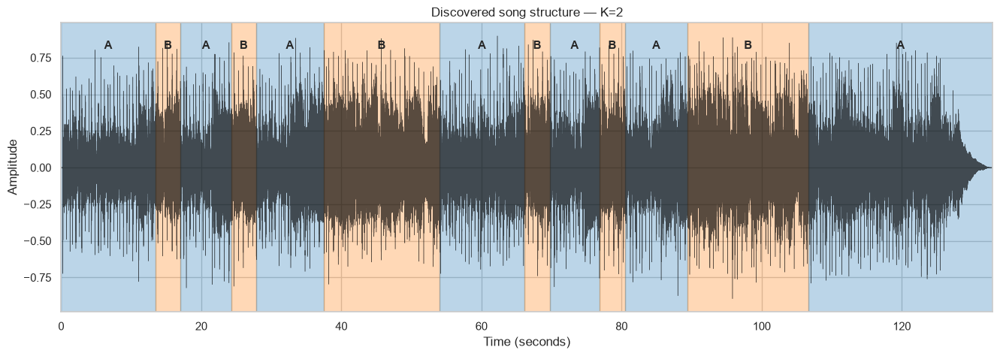

In [18]:
section_colors = {
    section: plt.cm.tab10(index % 10)
    for index, section in enumerate(segments["section"].unique())
}

fig, ax = plt.subplots(figsize=(16, 5))

ax.plot(
    wave_times,
    y,
    color="black",
    linewidth=0.35,
    alpha=0.65
)

for row in segments.itertuples():
    color = section_colors[row.section]

    ax.axvspan(
        row.start_seconds,
        row.end_seconds,
        color=color,
        alpha=0.30
    )

    midpoint = (
        row.start_seconds + row.end_seconds
    ) / 2

    ax.text(
        midpoint,
        0.92,
        row.section,
        transform=ax.get_xaxis_transform(),
        ha="center",
        va="center",
        fontweight="bold",
        fontsize=11
    )

ax.set(
    title=f"Discovered song structure — K={SELECTED_K}",
    xlabel="Time (seconds)",
    ylabel="Amplitude",
    xlim=(0, duration_seconds)
)

plt.show()

In [19]:
section_summary = (
    segments
    .groupby("section", as_index=False)
    .agg(
        occurrences=("segment", "count"),
        total_duration_seconds=("duration_seconds", "sum"),
        mean_duration_seconds=("duration_seconds", "mean"),
        first_start_seconds=("start_seconds", "min")
    )
    .sort_values("first_start_seconds")
)

display(section_summary.round(2))

,section,occurrences,total_duration_seconds,mean_duration_seconds,first_start_seconds
0,A,7,84.97,12.14,0.00
1,B,6,48.02,8.00,13.47


## 9. Evaluate the structure without ground-truth labels

There is no labelled answer available, so ordinary classification accuracy
cannot be calculated.

Instead, we use internal evidence:

- **Recurrence separation:** regions with the same label should have stronger
  graph connections than differently labelled regions.
- **Boundary contrast:** detected transitions should coincide with relatively
  large changes in the spectral representation.
- **K-means stability:** repeated initializations should produce similar
  partitions.

These diagnostics measure consistency with the representation, not whether a
musician would assign the same semantic names.

In [20]:
n_regions = len(selected_labels)

region_distance = np.abs(
    np.arange(n_regions)[:, None]
    - np.arange(n_regions)[None, :]
)

# Ignore the diagonal and very near temporal neighbors.
valid_pairs = region_distance > 3
same_section = (
    selected_labels[:, None]
    == selected_labels[None, :]
)

within_values = recurrence_graph[
    valid_pairs & same_section
]

between_values = recurrence_graph[
    valid_pairs & ~same_section
]

within_recurrence = (
    within_values.mean()
    if len(within_values)
    else np.nan
)

between_recurrence = (
    between_values.mean()
    if len(between_values)
    else np.nan
)

recurrence_separation = (
    within_recurrence - between_recurrence
)

# Change in the selected spectral coordinates between adjacent regions.
spectral_change = np.linalg.norm(
    np.diff(selected_features, axis=0),
    axis=1
)

boundary_positions = run_starts[1:] - 1

boundary_mask = np.zeros(
    len(spectral_change),
    dtype=bool
)

boundary_mask[boundary_positions] = True

boundary_change = (
    spectral_change[boundary_mask].mean()
    if boundary_mask.any()
    else np.nan
)

nonboundary_change = (
    spectral_change[~boundary_mask].mean()
    if (~boundary_mask).any()
    else np.nan
)

selected_score_row = score_table.loc[
    score_table["clusters"] == SELECTED_K
].iloc[0]

diagnostics = pd.DataFrame({
    "diagnostic": [
        "Mean recurrence within labels",
        "Mean recurrence between labels",
        "Recurrence separation",
        "Mean spectral change at boundaries",
        "Mean spectral change elsewhere",
        "K-means stability ARI"
    ],
    "value": [
        within_recurrence,
        between_recurrence,
        recurrence_separation,
        boundary_change,
        nonboundary_change,
        selected_score_row["mean_stability_ARI"]
    ]
})

display(diagnostics.round(4))

,diagnostic,value
0,Mean recurrence within labels,0.0277
1,Mean recurrence between labels,0.0011
2,Recurrence separation,0.0266
3,Mean spectral change at boundaries,0.3283
4,Mean spectral change elsewhere,0.0360
5,K-means stability ARI,1.0000


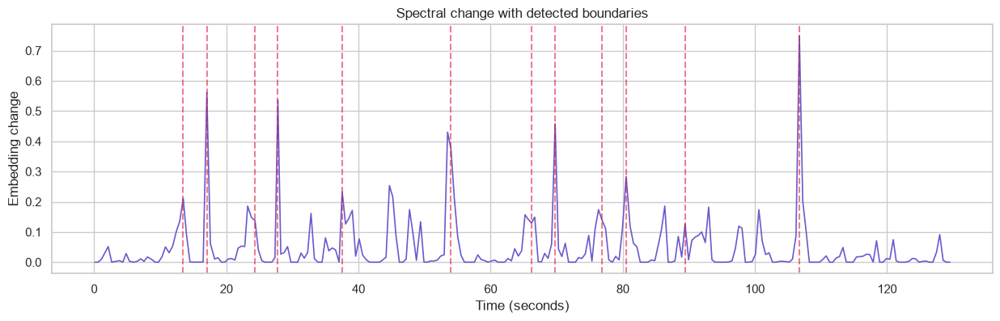

In [21]:
spectral_change_times = beat_times[1:]

fig, ax = plt.subplots(figsize=(15, 4))

ax.plot(
    spectral_change_times,
    spectral_change,
    color="slateblue",
    linewidth=1.2
)

for boundary_index in run_starts[1:]:
    ax.axvline(
        beat_times[boundary_index],
        color="crimson",
        linestyle="--",
        alpha=0.55
    )

ax.set(
    title="Spectral change with detected boundaries",
    xlabel="Time (seconds)",
    ylabel="Embedding change"
)

plt.show()

## 10. Listen to representative discovered sections

For each structural label, we listen to its longest occurrence.

This human audit is essential. It helps determine whether repeated labels
actually correspond to similar harmony, instrumentation, vocals, or rhythm.

In [22]:
representative_segments = (
    segments
    .sort_values("duration_seconds", ascending=False)
    .drop_duplicates("section")
    .sort_values("section")
)

for row in representative_segments.itertuples():
    start_sample = int(row.start_seconds * sr)
    end_sample = int(row.end_seconds * sr)

    # Limit previews to 25 seconds.
    end_sample = min(
        end_sample,
        start_sample + 25 * sr
    )

    print(
        f"Section {row.section}: "
        f"{row.start_clock}–{row.end_clock} "
        f"({row.duration_seconds:.1f} seconds)"
    )

    display(
        Audio(
            y[start_sample:end_sample],
            rate=sr
        )
    )

Section A: 01:46.72–02:12.99 (26.3 seconds)


Section B: 01:29.42–01:46.72 (17.3 seconds)


## Notes — Final results

### Structural sequence

The automatically selected two-state solution produces **13 consecutive segments** with the sequence:

**A → B → A → B → A → B → A → B → A → B → A → B → A**

Section A occurs seven times and covers **84.97 seconds** in total, while B occurs six times and covers **48.02 seconds**. A regions average 12.14 seconds and B regions average 8.00 seconds. However, B contains both very short passages of approximately 3.5 seconds and two much longer passages of 16.46 and 17.30 seconds. The labels should therefore be interpreted as two broad recurring acoustic states, not as confirmed verse and chorus classes.

The final A region runs from **106.72 to 132.99 seconds** and includes the fade-out, making it the longest detected segment. With only two clusters, the model cannot isolate a separate bridge or outro label. Also, the strict A/B alternation is partly a consequence of compressing consecutive predictions from a two-label model: after an A run ends, the next run must be B. The alternation itself is not proof of a perfect verse–chorus form.

### Internal evaluation

The partition is strongly supported by the graph representation. Mean recurrence is **0.0277 within labels** but only **0.0011 between labels**, giving a positive separation of **0.0266**. Same-label non-adjacent regions are therefore connected about 25 times more strongly on average than differently labelled regions.

Mean spectral change at detected boundaries is **0.3283**, compared with **0.0360** elsewhere—approximately nine times larger. The boundary plot confirms that most selected transitions coincide with local embedding-change peaks, especially around 17, 28, 54, 70, 81, and 107 seconds. A few boundaries occur at weaker peaks, and some unselected local peaks remain, so the result should be viewed as a coarse structural map rather than exact editorial cuts.

K-means stability is **ARI = 1.000**, meaning every tested initialization recovered the same K = 2 partition. Together, the recurrence separation, boundary contrast, and stability show that the result is internally coherent. They do not establish semantic accuracy because no human section annotations were used.

### Limitations

Beat-tracking errors can shift all later boundaries because the analysis is beat synchronized. Chroma can merge musically different sections that reuse the same chords, whereas MFCC changes can split a section after a change in instrumentation or vocal texture. The graph balance and number of clusters are modeling choices, and the heuristic naturally prefers a simple coarse solution. Most importantly, section letters express acoustic similarity rather than musical functions such as verse or chorus.

### Practical conclusion

The system succeeds as an unsupervised **coarse song-navigation and boundary-proposal tool**. It could provide candidate regions for waveform navigation, preview generation, remixing, or DJ software, while a user confirms and renames the sections. Before deployment across a music collection, it should be evaluated on many genres with annotated boundaries, include minimum-duration or hierarchical constraints, and compare chroma/MFCC features with stronger learned audio embeddings. Boundary precision and recall with a time tolerance would then provide external evaluation rather than relying only on internal graph metrics.